In [1]:
# import all necessary modules
import fasttext
import fasttext.util

# import pymorphy2
# import sys
import numpy as np
from numpy import genfromtxt
from numpy import dot
from numpy.linalg import norm
from numpy import reshape
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd

# import math
import seaborn as sns

# import csv
# import os.path
# import umap
# import hdbscan
import sklearn.cluster as cluster
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

# import plotly.express as px

In [26]:
# this is the sequence in which forms are written in the table
forms_full = [
    {"nomn"},
    {"gent"},
    {"datv"},
    {"accs"},
    {"ablt"},
    {"loct"},
    {"gen2"},
    {"plur", "nomn"},
    {"plur", "gent"},
    {"plur", "datv"},
    {"plur", "accs"},
    {"plur", "ablt"},
    {"plur", "loct"},
    {"plur", "gen2"},
]
tags = ["gender", "animacy"]

In [13]:
# here are some functions for getting to the relevant visualizations


def base_in_dict(ft, list_forms):
    form_in_dict = [[ft.get_word_id(x) for x in line] for line in list_forms]
    return form_in_dict


def get_all_difference_vectors_as_dict_center_base(
    list_of_lemmas, vectors_all_nouns, forms_full
):
    default_dicts = {"".join(case): [] for case in forms_full}
    key2id = {"".join(case): i for i, case in enumerate(forms_full)}
    id2key = ["".join(case) for case in forms_full]
    for lemma in range(0, len(list_of_lemmas)):
        X = vectors_all_nouns[lemma]
        kmeans = KMeans(n_clusters=1, random_state=0).fit(X)
        base_vec = kmeans.cluster_centers_[0]
        for formid in range(0, 14):
            if matrix_of_syncr[lemma][formid] == 2**formid:
                other_vec = vectors_all_nouns[lemma][formid]
                diff = other_vec - base_vec
                default_dicts[id2key[formid]].append(diff)
    return default_dicts


def get_dict_matrix_keys_of_diffs(default_dicts):
    keys = []
    all_diffs = []
    diff_dict = {}
    for key, value in default_dicts.items():
        if len(value) > 0:
            matrix = np.array(value)
            mean = np.mean(matrix, 0)
            default_dicts[key] = matrix
            diff_dict[key] = mean
            keys = np.append(keys, np.repeat(key, matrix.shape[0]))
            all_diffs = np.append(all_diffs, matrix)
    all_diffs_matrix = np.array(all_diffs)
    all_diffs_matrix = np.reshape(
        all_diffs_matrix, (all_diffs_matrix.shape[0] // 300, 300)
    )
    return diff_dict, all_diffs_matrix, keys


def get_dict_matrix_keys_of_diffs_restrict_items(default_dicts, max_number):
    keys = []
    all_diffs = []
    diff_dict = {}
    for key, value in default_dicts.items():
        if len(value) > 0 and len(value) < max_number:
            matrix = np.array(value)
            mean = np.mean(matrix, 0)
            default_dicts[key] = matrix
            diff_dict[key] = mean
            keys = np.append(keys, np.repeat(key, matrix.shape[0]))
            all_diffs = np.append(all_diffs, matrix)
        if len(value) >= max_number:
            matrix = np.array(value)
            random_indices = np.random.choice(
                matrix.shape[0], size=max_number, replace=False
            )
            random_rows = matrix[random_indices, :]
            mean = np.mean(random_rows, 0)
            default_dicts[key] = random_rows
            diff_dict[key] = mean
            keys = np.append(keys, np.repeat("".join(key), random_rows.shape[0]))
            all_diffs = np.append(all_diffs, random_rows)
    all_diffs_matrix = np.array(all_diffs)
    all_diffs_matrix = np.reshape(
        all_diffs_matrix, (all_diffs_matrix.shape[0] // 300, 300)
    )
    return diff_dict, all_diffs_matrix, keys


def get_dict_matrix_keys_of_diffs_restrict_syncr(default_dicts, max_number, dim=300):
    keys = []
    all_diffs = []
    diff_dict = {}
    for key, value in default_dicts.items():
        if len(value) >= max_number:
            matrix = np.array(value)
            random_indices = np.random.choice(
                matrix.shape[0], size=max_number, replace=False
            )
            random_rows = matrix[random_indices, :]
            mean = np.mean(random_rows, 0)
            default_dicts[key] = random_rows
            diff_dict[key] = mean
            keys = np.append(keys, np.repeat(key, random_rows.shape[0]))
            all_diffs = np.append(all_diffs, random_rows)
    all_diffs_matrix = np.array(all_diffs)
    all_diffs_matrix = np.reshape(
        all_diffs_matrix, (all_diffs_matrix.shape[0] // dim, dim)
    )
    return diff_dict, all_diffs_matrix, keys


def get_all_difference_vectors_as_dict_center_base(
    list_of_lemmas, vectors_all_nouns, forms_full
):
    default_dicts = {"".join(case): [] for case in forms_full}
    key2id = {"".join(case): i for i, case in enumerate(forms_full)}
    id2key = ["".join(case) for case in forms_full]
    for lemma in range(0, len(list_of_lemmas)):
        X = vectors_all_nouns[lemma]
        kmeans = KMeans(n_clusters=1, random_state=0).fit(X)
        base_vec = kmeans.cluster_centers_[0]
        for formid in range(0, 14):
            if matrix_of_syncr[lemma][formid] == 2**formid:
                other_vec = vectors_all_nouns[lemma][formid]
                diff = other_vec - base_vec
                default_dicts[id2key[formid]].append(diff)
    return default_dicts


def get_all_difference_vectors_as_dict_center_base_with_min_freq(
    full_info, list_of_lemmas, vectors_all_nouns, forms_full, min_freq=100
):
    default_dicts = {"".join(case): [] for case in forms_full}
    id2key = ["".join(case) for case in forms_full]
    for lemma in range(0, len(list_of_lemmas)):
        if full_info[lemma][2] != "None" and float(full_info[lemma][1]) > min_freq:
            X = vectors_all_nouns[lemma]
            kmeans = KMeans(n_clusters=1, random_state=0).fit(X)
            base_vec = kmeans.cluster_centers_[0]
            for formid in range(0, 14):
                if matrix_of_syncr[lemma][formid] == 2**formid:
                    other_vec = vectors_all_nouns[lemma][formid]
                    diff = other_vec - base_vec
                    default_dicts[id2key[formid]].append(diff)
    return default_dicts


def get_syncretic_difference_vectors_as_dict_center_base_in_dict(
    matrix_of_syncr,
    full_info,
    list_of_lemmas,
    vectors_all_nouns,
    forms_full,
    form_in_dict,
):
    cases = list(set(i for j in matrix_of_syncr for i in j))
    default_dicts = {case_id: [] for case_id in cases}
    id2key = ["".join(case) for case in forms_full]
    for lemma in range(0, len(list_of_lemmas)):
        if full_info[lemma][2] != "None":
            X = vectors_all_nouns[lemma]
            X = [X[i] for i in range(0, 14) if (matrix_of_syncr[lemma][i] != 0)]
            kmeans = KMeans(n_clusters=1, random_state=0).fit(X)
            base_vec = kmeans.cluster_centers_[0]
            for formid in range(0, 14):
                if (
                    matrix_of_syncr[lemma][formid] >= 2**formid
                    and form_in_dict[lemma][formid]
                ):
                    other_vec = vectors_all_nouns[lemma][formid]
                    diff = other_vec - base_vec
                    default_dicts[matrix_of_syncr[lemma][formid]].append(diff)
    return default_dicts


def get_syncretic_difference_vectors_as_dict_center_base_with_min_freq(
    matrix_of_syncr,
    full_info,
    list_of_lemmas,
    vectors_all_nouns,
    forms_full,
    min_freq=100,
):
    cases = list(set(i for j in matrix_of_syncr for i in j))
    default_dicts = {case_id: [] for case_id in cases}
    id2key = ["".join(case) for case in forms_full]
    for lemma in range(0, len(list_of_lemmas)):
        if full_info[lemma][2] != "None" and float(full_info[lemma][1]) > min_freq:
            X = vectors_all_nouns[lemma]
            X = [X[i] for i in range(0, 14) if (matrix_of_syncr[lemma][i] != 0)]
            kmeans = KMeans(n_clusters=1, random_state=0).fit(X)
            base_vec = kmeans.cluster_centers_[0]
            for formid in range(0, 14):
                if matrix_of_syncr[lemma][formid] >= 2**formid:
                    other_vec = vectors_all_nouns[lemma][formid]
                    diff = other_vec - base_vec
                    default_dicts[matrix_of_syncr[lemma][formid]].append(diff)
    return default_dicts


def get_dict_matrix_keys_of_diffs_restrict_items(default_dicts, max_number, dim=300):
    keys = []
    all_diffs = []
    diff_dict = {}
    for key, value in default_dicts.items():
        if len(value) >= max_number:
            matrix = np.array(value)
            random_indices = np.random.choice(
                matrix.shape[0], size=max_number, replace=False
            )
            random_rows = matrix[random_indices, :]
            mean = np.mean(random_rows, 0)
            default_dicts[key] = random_rows
            diff_dict[key] = mean
            keys = np.append(keys, np.repeat(key, random_rows.shape[0]))
            all_diffs = np.append(all_diffs, random_rows)
    all_diffs_matrix = np.array(all_diffs)
    all_diffs_matrix = np.reshape(
        all_diffs_matrix, (all_diffs_matrix.shape[0] // dim, dim)
    )
    return diff_dict, all_diffs_matrix, keys


def visualize(reduced_vectors, keys, colors, picture_title, filename, columns=1):
    df = pd.DataFrame()
    df["comp-1"] = reduced_vectors[:, 0]
    df["comp-2"] = reduced_vectors[:, 1]
    df["y"] = keys
    g = sns.scatterplot(
        x="comp-1",
        y="comp-2",
        hue=keys,
        palette=sns.color_palette("hls", colors),
        data=df,
    )
    g.set(title=picture_title)
    g.legend(loc="center left", bbox_to_anchor=(1.25, 0.5), ncol=columns)
    plt.savefig(filename, bbox_inches="tight")


pca_50 = PCA(n_components=50)
pca_2 = PCA(n_components=2)
tsne = TSNE(n_components=2)
tsne3 = TSNE(n_components=3)


def run_pca_tsne(vectors):
    pca_result_50 = pca_50.fit_transform(vectors)
    pca_tsne = tsne.fit_transform(pca_result_50)
    return pca_tsne


def run_pca(vectors):
    pca = pca_2.fit_transform(vectors)
    return pca

In [8]:
# load the pretrained fasttext model for Russian
# fasttext.util.download_model('ru', if_exists='ignore')  # Russian, already downloaded
#  ft = fasttext.load_model('../../data/cc.ru.300.bin')

# alternative: load the model we trained
ft = fasttext.load_model("../../data/final-model.bin")

In [ ]:
ft.get_labels()  # There are 1.433.658, seems to be equal to ft.get_words()
# ['</s>',
# 'на',
# 'года',
# 'по',
# 'году',
# 'из', ...

In [17]:
list_of_all_forms = np.loadtxt(
    "../../data/list_of_noun_forms_full.csv", dtype=object, delimiter=","
)
matrix_of_syncr = np.loadtxt(
    "../../data/matrix_of_syncr.csv", dtype=float, delimiter=","
).astype(int)

list_forms = list_of_all_forms[
    :, 4:
]  # pure forms without lemma, gender, frequency, animacy
# in this table a form at index i,j is not syncretic if matrix_of_syncr[i][j]==2**j

In [18]:
# Get all the vectors in the array.
vectors_all_nouns = [
    [ft.get_word_vector(x) for x in line] for line in list_forms
]  # Gets the vector for all word lemmas from list_forms

In [ ]:
vectors_all_nouns[0]
# [array([ 0.33686647, -0.24785934,  0.88080037,  0.62199295,  0.2993363 ,
#        -0.01615402, -0.19049172,  2.5375268 ,  0.8279105 ,  0.52955556,
#        -0.6227578 ,  1.2615061 ,  2.1233518 , -1.0611552 ,  1.8508104 , ...

In [ ]:
def_dict = get_all_difference_vectors_as_dict_center_base(
    list_forms, vectors_all_nouns, forms_full
)

In [28]:
def_dict["nomn"]

[array([ 5.26127662e-01,  6.34671770e-01,  2.30594609e+00, -1.17530899e+00,
         1.03063003e+00,  1.91242410e+00,  1.06986311e-01, -7.10487366e-04,
        -1.61784718e+00, -8.90387233e-01, -1.82544810e+00,  2.37150472e+00,
         4.04135021e-01, -1.37701609e+00,  7.20468228e-01, -1.87486890e+00,
        -6.91645863e-01,  8.49258442e-01, -8.96685470e-01,  2.78151927e+00,
         1.99358575e-01,  2.97434415e+00, -3.55837493e-01,  9.87101359e-01,
        -5.00571804e-01,  4.08016677e-01, -9.66921483e-01,  1.53018055e-01,
         1.40685463e+00, -1.07812210e+00,  3.92286858e-01,  5.83676875e-01,
        -8.18087288e-02, -1.26302334e+00,  7.01551205e-01, -3.88045858e-01,
        -1.36068610e+00, -2.77201836e-01,  1.00162144e+00, -9.10912716e-01,
         2.32066793e+00,  6.53905894e-01, -2.74452123e+00,  1.19000259e+00,
         1.60963333e+00,  9.42791251e-01,  1.09975435e+00,  2.04052766e+00,
         8.86155429e-01,  7.81051726e-01, -8.83455928e-01,  4.61725576e-01,
        -1.8

In [ ]:
pd.DataFrame(vectors_all_nouns).to_csv("../../data/vectors_file.csv")

In [30]:
form_in_dict = base_in_dict(ft, list_forms)
np.savetxt('form_in_dict.csv', form_in_dict, fmt='%s', delimiter=',')
form_in_dict = np.loadtxt("form_in_dict.csv", dtype=float, delimiter=',').astype(int)

In [31]:
form_in_dict

array([[    46,    160,   6257, ...,   2530,  13004,    321],
       [    38,      2,      4, ...,   2361,     61,    147],
       [    24,    155,    155, ...,  20360,  54267,   1862],
       ...,
       [704575, 985023,     -1, ...,     -1,     -1, 930069],
       [757576, 788790,     -1, ...,     -1,     -1, 788790],
       [101659,  65673, 116211, ...,     -1,     -1,     -1]])

/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

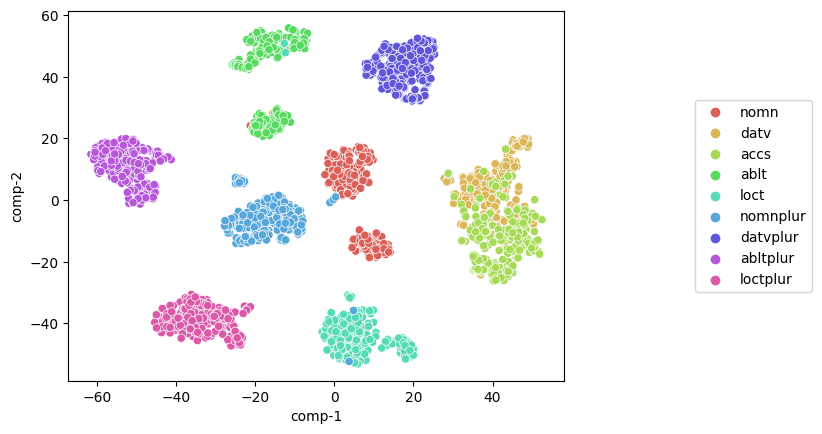

In [32]:
# 100 of the available non-syncretic difference vectors are taken for dimensionality reduction for each case
diff_dict, all_diffs_matrix, keys = get_dict_matrix_keys_of_diffs_restrict_items(
    get_all_difference_vectors_as_dict_center_base(
        list_forms, vectors_all_nouns, forms_full
    ),
    300,
)
pca_tsne = run_pca_tsne(all_diffs_matrix)
visualize(
    pca_tsne,
    keys,
    len(diff_dict.keys()),
    "",
    "../../figures/pca_tsne_differences_nouns_unique_cases_max_300_base_center.png",
)

/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

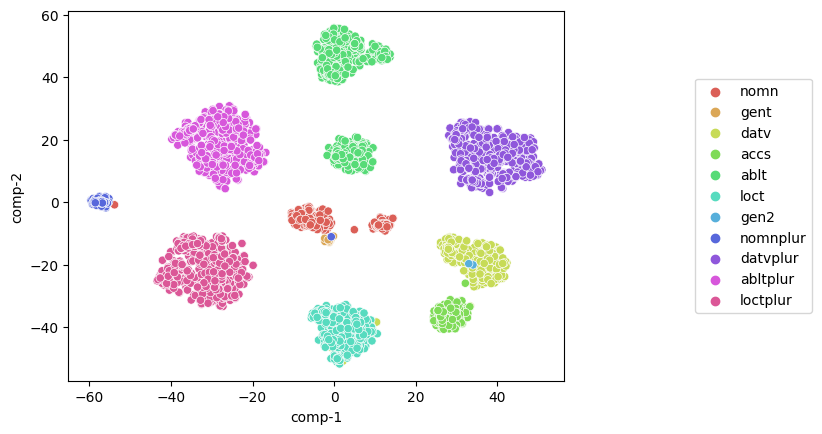

In [33]:
#All the available non-syncretic difference vectors of nouns with frequency > 100 are taken for dimensionality reduction
diff_dict, all_diffs_matrix, keys = get_dict_matrix_keys_of_diffs(
    get_all_difference_vectors_as_dict_center_base_with_min_freq(list_of_all_forms, list_forms, vectors_all_nouns, forms_full, 100))  
pca_tsne = run_pca_tsne(all_diffs_matrix) 
pca = run_pca(all_diffs_matrix)
visualize(pca_tsne, keys, len(diff_dict.keys()), 
          "", 
          "../../figures/pca_tsne_differences_nouns_unique_cases_base_center_freq_min_100.png")

/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

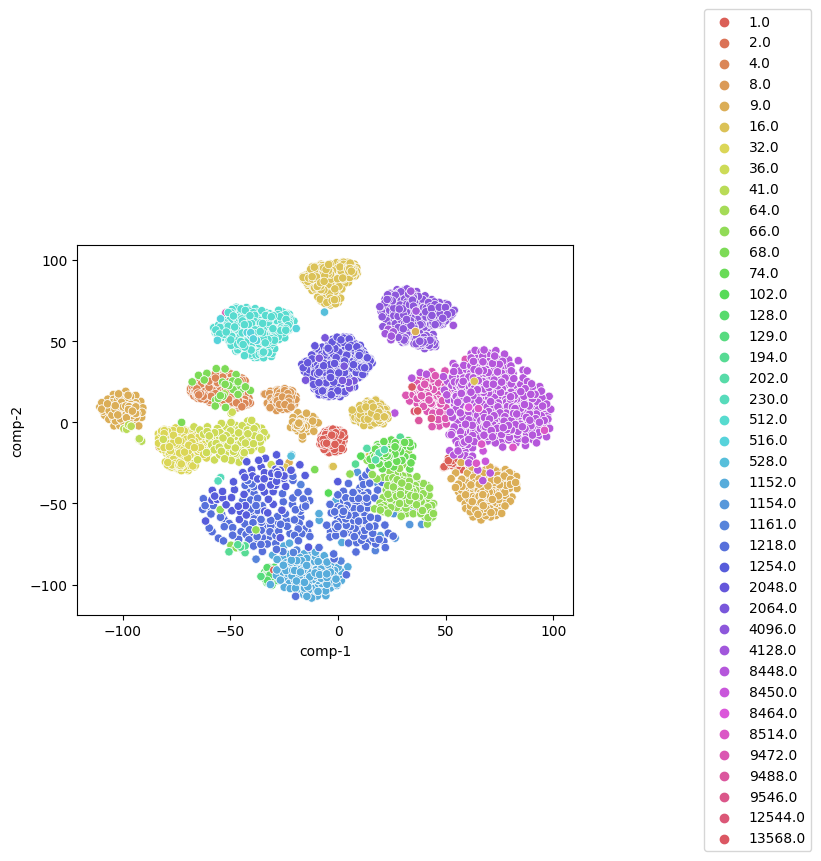

In [34]:
diff_dict, all_diffs_matrix, keys = get_dict_matrix_keys_of_diffs(
    get_syncretic_difference_vectors_as_dict_center_base_with_min_freq(matrix_of_syncr,list_of_all_forms, list_forms, vectors_all_nouns, forms_full))  
pca_tsne = run_pca_tsne(all_diffs_matrix) 
pca = run_pca(all_diffs_matrix)
visualize(pca_tsne, keys, len(diff_dict.keys()), 
          "", 
          "../../figures/syncretic_differences_base_center_freq_min_100_our_cbow.png")

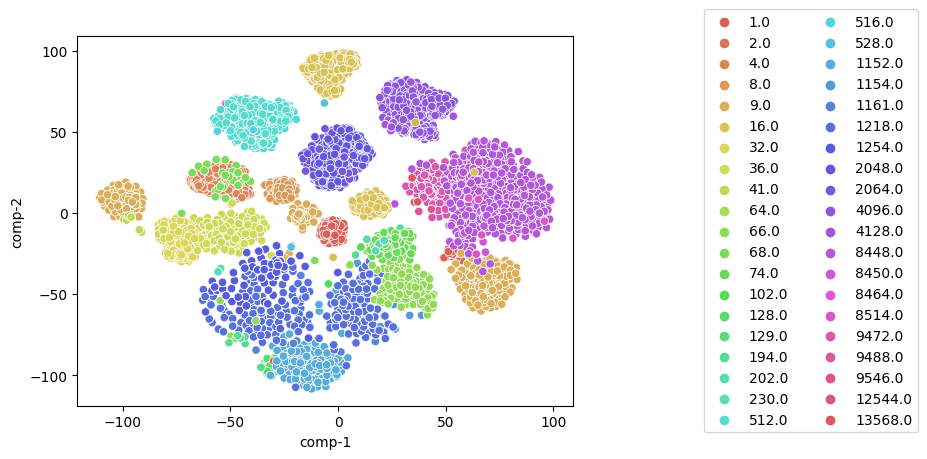

In [35]:
visualize(pca_tsne, keys, len(diff_dict.keys()), 
          "", 
          "../../figures/syncretic_differences_base_center_freq_min_100_our_cbow.png", 2)

/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

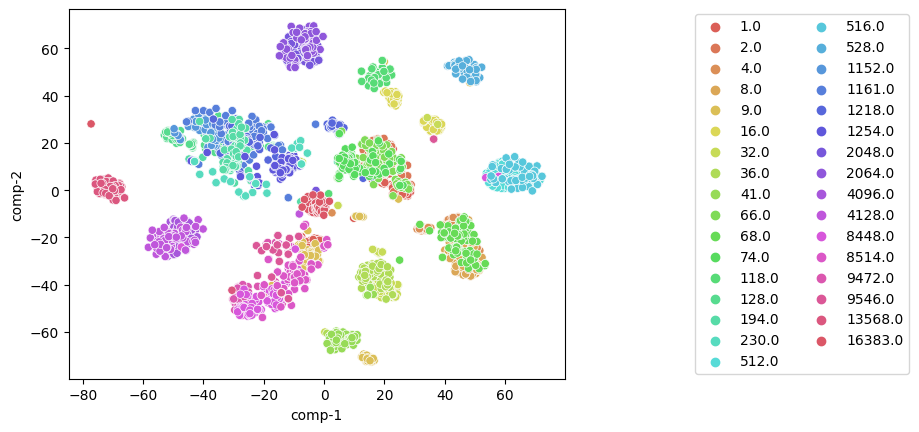

In [36]:
get_syncretic_difference_vectors_as_dict_center_base_in_dict
diff_dict, all_diffs_matrix, keys = get_dict_matrix_keys_of_diffs_restrict_items(
    get_syncretic_difference_vectors_as_dict_center_base_in_dict(matrix_of_syncr,list_of_all_forms, list_forms, vectors_all_nouns, forms_full, form_in_dict),100)  
pca_tsne = run_pca_tsne(all_diffs_matrix) 
pca = run_pca(all_diffs_matrix)
visualize(pca_tsne, keys, len(diff_dict.keys()), 
          "", 
          "../../figures/syncretic_differences_base_center_freq_in_dict_our_cbow_max_100.png", 2)

/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/anna/repos/NoClu/nocluV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

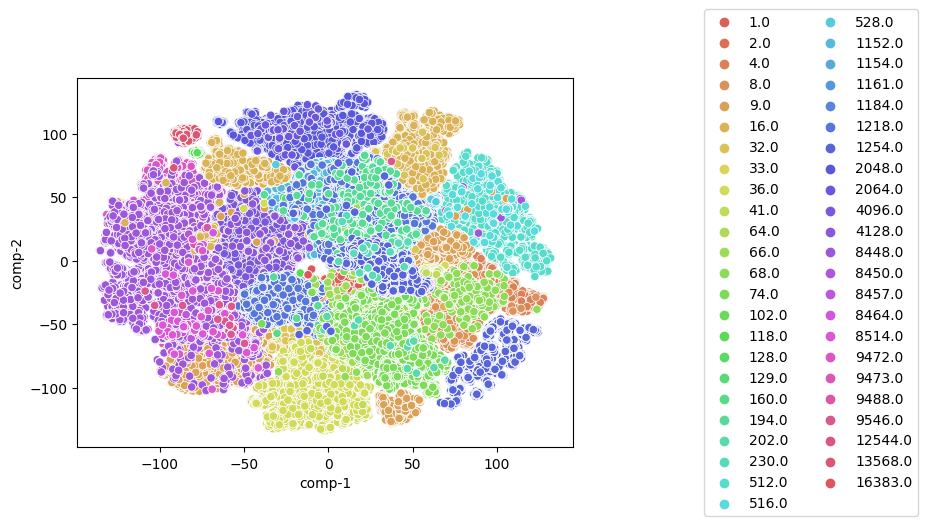

In [37]:
get_syncretic_difference_vectors_as_dict_center_base_in_dict
diff_dict, all_diffs_matrix, keys = get_dict_matrix_keys_of_diffs(
    get_syncretic_difference_vectors_as_dict_center_base_in_dict(matrix_of_syncr,list_of_all_forms, list_forms, vectors_all_nouns, forms_full, form_in_dict))  
pca_tsne = run_pca_tsne(all_diffs_matrix) 
pca = run_pca(all_diffs_matrix)
visualize(pca_tsne, keys, len(diff_dict.keys()), 
          "", 
          "../../figures/syncretic_differences_base_center_freq_in_dict_our_cbow.png", 2)

In [38]:
nouns_with_categories = np.loadtxt("noun_categories.csv", dtype=object, delimiter=';')
nouns_with_categories = np.delete(nouns_with_categories,[4],1)

FileNotFoundError: noun_categories.csv not found.

In [ ]:
noun_categories = nouns_with_categories[:, 1:-1]
condition = noun_categories[-1, :].astype(float) >= 20
big_categories = noun_categories[:, condition]
big_category_names = nouns_with_categories[:, 1:-1]
big_category_names = big_category_names[0, condition]
filter_nouns = np.sum(big_categories[1:-1, :].astype(float), axis=1) >= 1
selected_noun_stems = nouns_with_categories[1:-1]
selected_noun_stems = selected_noun_stems[filter_nouns, 0]
big_categories = big_categories[1:-1]
big_categories = big_categories[filter_nouns, :]
categories = []
category_labels = []
for i in range(0, len(selected_noun_stems)):
    cat_condition = big_categories[i, :].astype(float) == 1
    cat = big_category_names[cat_condition]
    categories = np.append(categories, cat[0])
    category_labels = np.append(category_labels, " ".join(cat))
vectors_nouns_with_categories = [ft.get_word_vector(x) for x in selected_noun_stems]

In [ ]:
pca_tsne = run_pca_tsne(vectors_nouns_with_categories)

In [ ]:
df = pd.DataFrame()
df["comp-1"] = pca_tsne[:,0]
df["comp-2"] = pca_tsne[:,1]
df["y"] = categories
df["word"] = selected_noun_stems
df["label"] = category_labels
fig = px.scatter(df, x="comp-1", y="comp-2", custom_data=["word", "label"],
              color=df.y.tolist())
fig.update_traces(
    hovertemplate="<br>".join([
        "ColX: %{customdata[0]}",
        "Col1: %{customdata[1]}"
    ])
)
fig.show()
fig.write_image('../../figures/noun_categories.png')